In [1]:
import cv2
import math
import time
import random
import pandas            as pd
import numpy             as np
import matplotlib.pyplot as plt
from   scipy.stats       import entropy
from   matplotlib        import rcParams

In [2]:
# Path to images for encrypting
doraemon_image_path      = '../Pictures/doraemon.webp'
tom_and_jerry_image_path = '../Pictures/tom_and_jerry.jpg'
inside_out_image_path    = '../Pictures/inside_out.jpg'
blue_rose_image_path     = '../Pictures/blue_rose.jpg'
boy_image_path           = '../Pictures/boy.jpg'
flowers_image_path       = '../Pictures/flowers.jpg'
idea_image_path          = '../Pictures/idea.png'
jerry_image_path         = '../Pictures/jerry.jpg'
panda_image_path         = '../Pictures/panda.webp'

In [3]:
# Reading the images for further processing
doraemon_image      = cv2.imread(doraemon_image_path)
tom_and_jerry_image = cv2.imread(tom_and_jerry_image_path)
inside_out_image    = cv2.imread(inside_out_image_path)
blue_rose_image     = cv2.imread(blue_rose_image_path)
boy_image           = cv2.imread(boy_image_path)
flowers_image       = cv2.imread(flowers_image_path)
idea_image          = cv2.imread(idea_image_path)
jerry_image         = cv2.imread(jerry_image_path)
panda_image         = cv2.imread(panda_image_path)

In [4]:
# Splitting the different images into red, blue and green images
# cv2 splits the images in order of blue, green and red channels
# while it merges the images in the order of red, green and blue channels
blue_doraemon_image,      green_doraemon_image,      red_doraemon_image      = cv2.split(np.array(doraemon_image))
blue_tom_and_jerry_image, green_tom_and_jerry_image, red_tom_and_jerry_image = cv2.split(np.array(tom_and_jerry_image))
blue_inside_out_image,    green_inside_out_image,    red_inside_out_image    = cv2.split(np.array(inside_out_image))
blue_blue_rose_image,     green_blue_rose_image,     red_blue_rose_image     = cv2.split(np.array(blue_rose_image))
blue_boy_image,           green_boy_image,           red_boy_image           = cv2.split(np.array(boy_image))
blue_flowers_image,       green_flowers_image,       red_flowers_image       = cv2.split(np.array(flowers_image))
blue_idea_image,          green_idea_image,          red_idea_image          = cv2.split(np.array(idea_image))
blue_jerry_image,         green_jerry_image,         red_jerry_image         = cv2.split(np.array(jerry_image))
blue_panda_image,         green_panda_image,         red_panda_image         = cv2.split(np.array(panda_image))

In [5]:
# Getting the dimensions of the differnt images
x_doraemon_image,      y_doraemon_image,      z_doraemon_image      = np.shape(doraemon_image)
x_tom_and_jerry_image, y_tom_and_jerry_image, z_tom_and_jerry_image = np.shape(tom_and_jerry_image)
x_inside_out_image,    y_inside_out_image,    z_inside_out_image    = np.shape(inside_out_image)
x_blue_rose_image,     y_blue_rose_image,     z_blue_rose_image     = np.shape(blue_rose_image)
x_boy_image,           y_boy_image,           z_boy_image           = np.shape(boy_image)
x_flowers_image,       y_flowers_image,       z_flowers_image       = np.shape(flowers_image)
x_idea_image,          y_idea_image,          z_idea_image          = np.shape(idea_image)
x_jerry_image,         y_jerry_image,         z_jerry_image         = np.shape(jerry_image)
x_panda_image,         y_panda_image,         z_panda_image         = np.shape(panda_image)

In [6]:
# Merging the three different channels to get the image
rgb_doraemon_image       = cv2.merge([red_doraemon_image,      green_doraemon_image,      blue_doraemon_image])
rgb_tom_and_jerry_image  = cv2.merge([red_tom_and_jerry_image, green_tom_and_jerry_image, blue_tom_and_jerry_image])
rgb_inside_out_image     = cv2.merge([red_inside_out_image,    green_inside_out_image,    blue_inside_out_image])
rgb_blue_rose_image      = cv2.merge([red_blue_rose_image,     green_blue_rose_image,     blue_blue_rose_image])
rgb_boy_image            = cv2.merge([red_boy_image,           green_boy_image,           blue_boy_image])
rgb_flowers_image        = cv2.merge([red_flowers_image,       green_flowers_image,       blue_flowers_image])
rgb_idea_image           = cv2.merge([red_idea_image,          green_idea_image,          blue_idea_image])
rgb_jerry_image          = cv2.merge([red_jerry_image,         green_jerry_image,         blue_jerry_image])
rgb_panda_image          = cv2.merge([red_panda_image,         green_panda_image,         blue_panda_image])

In [7]:
# Function to display images horizontally in IPython Cell
# length             - Length of the figure
# breadth            - Breadth of the figure
# rows               - Number of rows to be there in the plot
# columns            - Number of columns to be there in the plot
# images_list        - List of images to be displayed
# images_titles_list - list of titles to the images to be displayed
def display_images_horizontaly(length, breadth, rows, columns, images_list, images_titles_list): 
    rcParams['figure.figsize'] = length, breadth
    figure, axis = plt.subplots(rows, columns)
    for i in range(rows):
        for j in range(columns):
            one_dimensional_index = rows * i + j
            axis[i][j].set_title(images_titles_list[one_dimensional_index])
            axis[i][j].imshow(images_list[one_dimensional_index])
    return None

In [8]:
# Creating list of all the images and images titles
images_list        = [rgb_doraemon_image, rgb_tom_and_jerry_image, rgb_inside_out_image, rgb_blue_rose_image, rgb_boy_image, 
                      rgb_flowers_image, rgb_idea_image, rgb_jerry_image, rgb_panda_image]
images_titles_list = ["Doraemon Image", "Tom and Jerry Image", "Inside Out Image", "Blue Rose Image", "Boy Image",
                      "Flowers Image", "Idea Image", "Jerry Image", "Panda Image"]

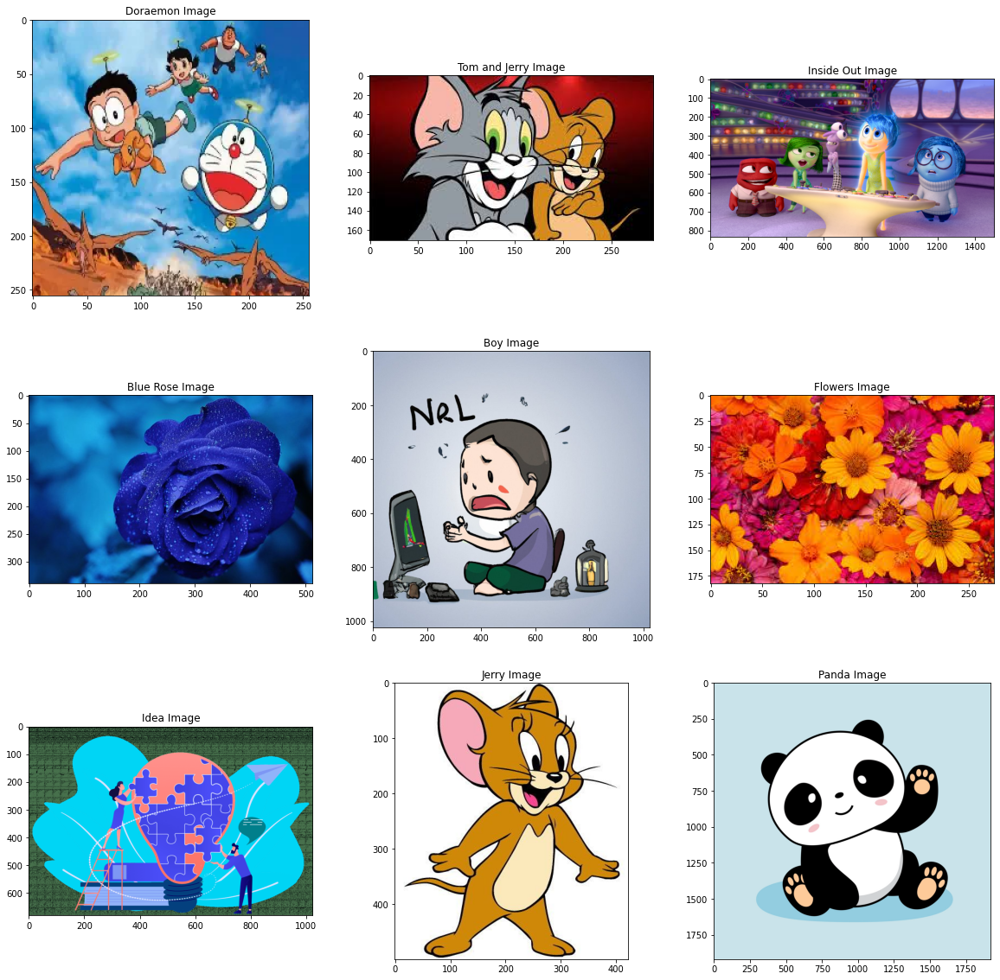

In [10]:
display_images_horizontaly(20, 20, 3, 3, images_list, images_titles_list)

In [11]:
# Constants for getting combined transformation transformation indexes
THETA     = 70
VELOCITY1 = 21
VELOCITY2 = 12
TIME      = 34
FREQUENCY = 15

In [12]:
# Fnction to get combined transformation indexes
# This uses Galilean and Rotational transformation for exchanging pixels in the image
# x     - the x index to be transformed
# y     - the y index to be transformed
# theta - angle of transformation for rotational transformation
# v1    - velocity for galilean transformation of x index
# v2    - velocity for galilean transformation of y index
# l     - length for confining the x transformation 
# b     - breadth for confining the y transformation
# t     - time for performing galilean transformation
def get_combined_transformation(x, y, theta, v1, v2, l, b, t):
    x1 = x * math.cos(theta) - y * math.sin(theta) + v1 * t
    y1 = x * math.sin(theta) + y * math.cos(theta) + v2 * t
    return int(x1) % l, int(y1) % b

In [13]:
# Function to perform combined gallilean and rotational transformation on an image
# theta   - angle of transformation for rotational transformation
# v1      - velocity for galilean transformation of x index
# v2      - velocity for galilean transformation of y index
# t       - time for galilean transformation
# f       - frequency of application of diffusion
# image   - image to be transformed
# reverse - whether or not reverse transformation is to be performed, by default it is false
def perform_combined_transformation_in_image(theta, v1, v2, t, f, image, reverse = False):
    x, y, z = np.shape(image)
    blue, green, red = cv2.split(np.array(image))
    row_start, row_end, row_step = 0, x, 1
    col_start, col_end, col_step = 0, y, 1
    if reverse:
        row_start, row_end, row_step = x - 1, -1, -1
        col_start, col_end, col_step = y - 1, -1, -1
    for k in range(f):
        for i in range(row_start, row_end, row_step):
            for j in range(col_start, col_end, col_step):
                new_i, new_j = get_combined_transformation(i, j, theta, v1, v2, x, y, t)
                red[i][j]   ^= red[new_i][new_j]
                blue[i][j]  ^= blue[new_i][new_j]
                green[i][j] ^= green[new_i][new_j]
    if reverse:
        return cv2.merge([blue, green, red])
    return cv2.merge([red, green, blue])

In [14]:
# Kaa Mapping of images for diffusion of pixels
kaa_mapped_doraemon_image      = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          rgb_doraemon_image)
kaa_mapped_tom_and_jerry_image = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          rgb_tom_and_jerry_image)
kaa_mapped_inside_out_image    = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          rgb_inside_out_image)
kaa_mapped_blue_rose_image     = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          rgb_blue_rose_image)
kaa_mapped_boy_image           = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          rgb_boy_image)
kaa_mapped_flowers_image       = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          rgb_flowers_image)
kaa_mapped_idea_image          = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          rgb_idea_image)
kaa_mapped_jerry_image         = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          rgb_jerry_image)
kaa_mapped_panda_image         = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          rgb_panda_image)

In [15]:
kaa_mapped_images_list        = [kaa_mapped_doraemon_image, kaa_mapped_tom_and_jerry_image, kaa_mapped_inside_out_image,
                                 kaa_mapped_blue_rose_image, kaa_mapped_boy_image, kaa_mapped_flowers_image,
                                 kaa_mapped_idea_image, kaa_mapped_jerry_image, kaa_mapped_panda_image]
kaa_mapped_images_titles_list = ["KAA Mapped Doraemon Image", "KAA Mapped Tom and Jerry Image", "KAA Mapped Inside Out Image",
                                 "KAA Mapped Blue Rose Image", "KAA Mapped Boy Image", "KAA Mapped Flowers Image",
                                 "KAA Mapped Idea Image", "KAA Mapped Jerry Image", "KAA Mapped Panda Image"]

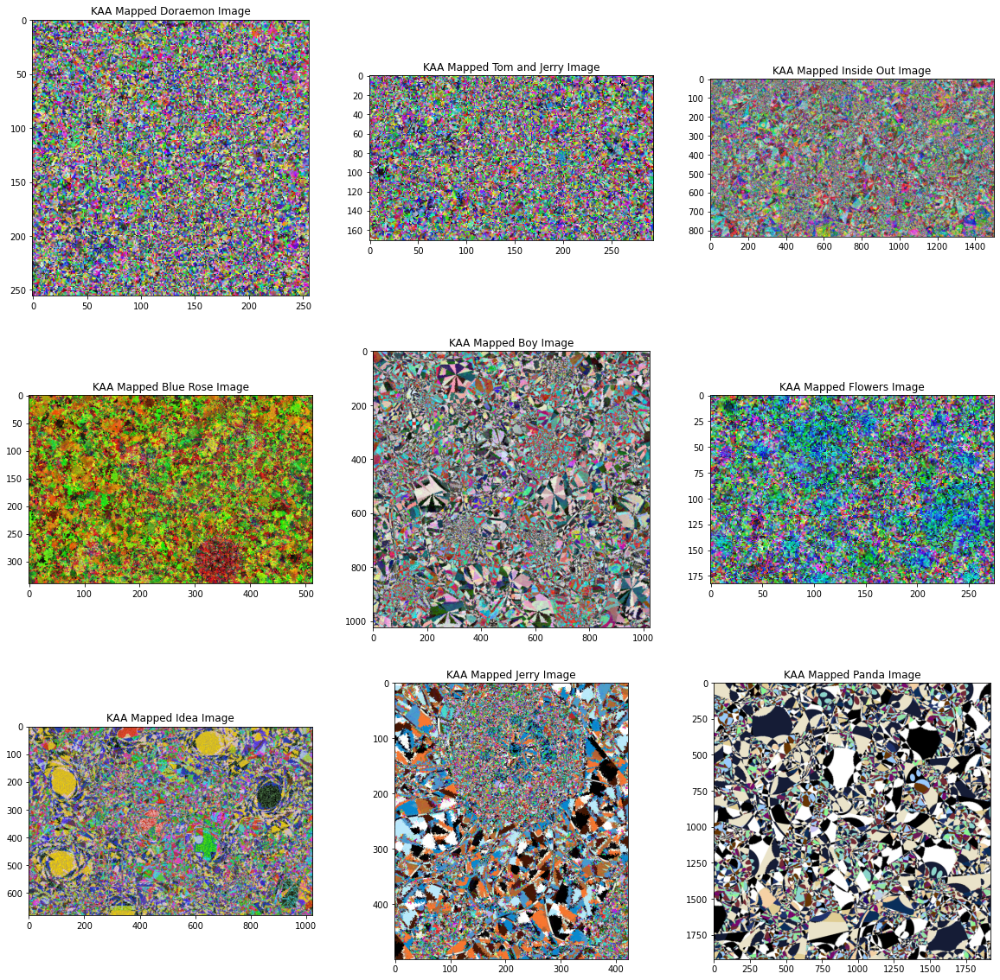

In [16]:
display_images_horizontaly(20, 20, 3, 3, kaa_mapped_images_list, kaa_mapped_images_titles_list)

In [17]:
# Constants for 2D Logistic Adjusted Sine Map
X = 0.3
Y = 0.3
U = 0.9

In [18]:
# Function to get 2D Logistic Adjusted Sine Map
# This is a combination of Logistic Map and Sine Map to add Chaos to the image
# This is used to create the first key for creating confusion in the image 
# x       - The starting value of x for the sequence
# y       - The starting value of y for the sequence
# u       - The control parameter for the sequence
# limit_x - Number of elements required in the x sequence 
# limit_y - Number of elements required in the y sequence
def get_2D_logistic_adjusted_sine_map(x, y, u, limit_x, limit_y):
    def get_next_x(x, y, u):
        return math.sin(math.pi * u * (y + 3) * x * (1 - x))
    def get_next_y(x, y, u):
        return math.sin(math.pi * u * (x + 3) * y * (1 - x))
    result_x = []
    result_y = []
    for i in range(limit_x):
        x = get_next_x(x, y, u)
        result_x.append(x)
    for i in range(limit_y):
        y = get_next_y(x, y, u)
        result_y.append(y)
    return result_x, result_y

In [19]:
# Function to get 2D Logistic Adjusted Sine Map for a particular image
# x     - The starting value of x for the sequence
# y     - The starting value of y for the sequence
# u     - The control parameter for the sequence
# image - The image for which the 2D adjusted logistic sine map sequence is required
def get_2D_logistic_adjusted_sine_map_for_image(x, y, u, image):
    limit_x, limit_y, z = np.shape(image)
    return get_2D_logistic_adjusted_sine_map(x, y, u, limit_x, limit_y)

In [20]:
# The 2D logistic sequences for different images
result_x_doraemon_image,      result_y_doraemon_image      = get_2D_logistic_adjusted_sine_map_for_image(
    X, Y, U, rgb_doraemon_image)
result_x_tom_and_jerry_image, result_y_tom_and_jerry_image = get_2D_logistic_adjusted_sine_map_for_image(
    X, Y, U, rgb_tom_and_jerry_image)
result_x_inside_out_image,    result_y_inside_out_image    = get_2D_logistic_adjusted_sine_map_for_image(
    X, Y, U, rgb_inside_out_image)
result_x_blue_rose_image,     result_y_blue_rose_image     = get_2D_logistic_adjusted_sine_map_for_image(
    X, Y, U, rgb_blue_rose_image)
result_x_boy_image,           result_y_boy_image           = get_2D_logistic_adjusted_sine_map_for_image(
    X, Y, U, rgb_boy_image)
result_x_flowers_image,       result_y_flowers_image       = get_2D_logistic_adjusted_sine_map_for_image(
    X, Y, U, rgb_flowers_image)
result_x_idea_image,          result_y_idea_image          = get_2D_logistic_adjusted_sine_map_for_image(
    X, Y, U, rgb_idea_image)
result_x_jerry_image,         result_y_jerry_image         = get_2D_logistic_adjusted_sine_map_for_image(
    X, Y, U, rgb_jerry_image)
result_x_panda_image,         result_y_panda_image         = get_2D_logistic_adjusted_sine_map_for_image(
    X, Y, U, rgb_panda_image)

In [87]:
# ### IEEE - 754 double precision convertor

# 1. Convert given number in binary
# 2. Represent converted binary number into scientific notation
# 3. Convert number into IEEE -754 dobule precision 64bit format

# 1st bit - sign (+ve = 0, -ve = 1)     
# Next 11 bits - exponent bias + power  (2<sup>(k - 1)</sup> - 1) + p      
# Next 52 bits - mantissa    

In [22]:
# Function to get exponent of a number in scientific notation
# binary_number - Binary number in string format to get the exponent when the number is written in scientific format
def get_exponent_in_scientific_notation(binary_number):
    return len([each for each in binary_number]) - 1

In [23]:
# Function to get exponent bias added with the power
# binary_number - Binary number in string format for which the exponent bias plus power is required
# k             - Number of bits to be considered in the exponent bias plus power, by default this is 11
def get_exponent_bias_plus_power(binary_number, k = 11):
    exponent_bias = 11
    power = get_exponent_in_scientific_notation(binary_number)
    return bin(((2 ** (k - 1)) - 1) + power)[2:]

In [24]:
# Function to convert a binary number to required number of bits
# binary_number - The binary number which needs to be converted to required number of bits
# required_bits - The number of bits to be considered in the binary number
def convert_binary_number_to_required_bits(binary_number, required_bits):
    if len(binary_number) > required_bits:
        return binary_number[:required_bits]
    return '0' * (required_bits - len(binary_number)) + binary_number

In [25]:
# Function to convert a decimal point number into IEE 754 double precision notation
# decimal_point_number - The number in decimal points that need to be converted
def IEEE_754_double_precision_convertor(decimal_point_number):
    sign = '0'
    if decimal_point_number < 0:
        sign = '1'
        decimal_point_number *= -1
    decimal_point_number = '{0:.50f}'.format(decimal_point_number)
    number_before_decimal, number_after_decimal = decimal_point_number.split('.')
    number_before_decimal, number_after_decimal = int(number_before_decimal), int(number_after_decimal)
    binary_number_before_decimal = bin(number_before_decimal)[2:]
    binary_number_after_decimal = bin(number_after_decimal)[2:]
    exponent = get_exponent_bias_plus_power(binary_number_before_decimal)
    mantissa = binary_number_before_decimal[1:] + binary_number_after_decimal
    return sign + convert_binary_number_to_required_bits(exponent, 11) + convert_binary_number_to_required_bits(mantissa, 52)

In [26]:
# The floating point output sequences, x and y,
# resulting from the 2D Sine Logistic Map are then
# converted to 64–bit by utilizing the IEEE–754 double precision conversion. The control parameter a
# is converted to 64–bit in the same manner. Nevertheless, it is shortened, such that only the first
# 44 bits are employed.

In [27]:
# Converting the 2D Logistic Adjusted Sine Map sequences of different images in IEEE-754 double precision format
converted_result_x_doraemon_image,      converted_result_y_doraemon_image      = \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_x_doraemon_image], \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_y_doraemon_image]
converted_result_x_tom_and_jerry_image, converted_result_y_tom_and_jerry_image = \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_x_tom_and_jerry_image],\
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_y_tom_and_jerry_image]
converted_result_x_inside_out_image,    converted_result_y_inside_out_image    = \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_x_inside_out_image], \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_y_inside_out_image]
converted_result_x_blue_rose_image,     converted_result_y_blue_rose_image     = \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_x_blue_rose_image], \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_y_blue_rose_image]
converted_result_x_boy_image,           converted_result_y_boy_image           = \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_x_boy_image], \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_y_boy_image]
converted_result_x_flowers_image,       converted_result_y_flowers_image       = \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_x_flowers_image], \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_y_flowers_image]
converted_result_x_idea_image,          converted_result_y_idea_image          = \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_x_idea_image], \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_y_idea_image]
converted_result_x_jerry_image,         converted_result_y_jerry_image         = \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_x_jerry_image], \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_y_jerry_image]
converted_result_x_panda_image,         converted_result_y_panda_image         = \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_x_panda_image], \
[int(IEEE_754_double_precision_convertor(each), 2) for each in result_y_panda_image]

In [28]:
# Converting the control parameter into the IEEE 754 double precision format
control_a = int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(U), 44), 2)

In [29]:
# Constants for Linear Congruential Generator
L10, AL1, C1, M1 = 358644446, 27, 0, (2 ** 52) - 1
L20, AL2, C2, M2 = 2700000, 37, 1, (2 ** 32) - 1

In [30]:
# Function to calculate Linear Congruential Sequence
# x     - The starting of the sequence
# a     - The control paramer of the sequence
# c     - The constant of the sequence
# m     - The max limit to confine the output
# limit - The number of elements to be generated in the sequence
def linear_congruential_generator(x, a, c, m, limit):
    def get_next_element(x, a, c, m):
        return (a * x - 1 + c) % m
    result = []
    for i in range(limit):
        result.append(x)
        x = get_next_element(x, a, c, m)
    return result

In [31]:
# Function to get the linear congruential sequence for length and breadth of the image
# x          - The starting of the sequence
# a          - The control paramer of the sequence
# c          - The constant of the sequence
# m          - The max limit to confine the output
# image      - The image for which the linear congruential sequence is required
# is_length  - Whether the sequence is required according to the length of the image
# is_breadth - Whether the sequence is required according to the breadth of the image
def get_linear_congruential_sequence_for_image(x, a, c, m, image, is_length, is_breadth):
    limit_x, limit_y, z = np.shape(image)
    if is_length:
        return linear_congruential_generator(x, a, c, m, limit_x)
    if is_breadth:
        return linear_congruential_generator(x, a, c, m, limit_y)
    return []

In [32]:
# The 2D logistic sequences for different images
result_1_doraemon_image,      result_2_doraemon_image      = \
get_linear_congruential_sequence_for_image(L10, AL1, C1, M1, rgb_doraemon_image, True, False), \
get_linear_congruential_sequence_for_image(L20, AL2, C2, M2, rgb_doraemon_image, False, True)
result_1_tom_and_jerry_image, result_2_tom_and_jerry_image = \
get_linear_congruential_sequence_for_image(L10, AL1, C1, M1, rgb_tom_and_jerry_image, True, False), \
get_linear_congruential_sequence_for_image(L20, AL2, C2, M2, rgb_tom_and_jerry_image, False, True)
result_1_inside_out_image,    result_2_inside_out_image    = \
get_linear_congruential_sequence_for_image(L10, AL1, C1, M1, rgb_inside_out_image, True, False), \
get_linear_congruential_sequence_for_image(L20, AL2, C2, M2, rgb_inside_out_image, False, True)
result_1_blue_rose_image,     result_2_blue_rose_image     = \
get_linear_congruential_sequence_for_image(L10, AL1, C1, M1, rgb_blue_rose_image, True, False), \
get_linear_congruential_sequence_for_image(L20, AL2, C2, M2, rgb_blue_rose_image, False, True)
result_1_boy_image,           result_2_boy_image           = \
get_linear_congruential_sequence_for_image(L10, AL1, C1, M1, rgb_boy_image, True, False), \
get_linear_congruential_sequence_for_image(L20, AL2, C2, M2, rgb_boy_image, False, True)
result_1_flowers_image,       result_2_flowers_image       = \
get_linear_congruential_sequence_for_image(L10, AL1, C1, M1, rgb_flowers_image, True, False), \
get_linear_congruential_sequence_for_image(L20, AL2, C2, M2, rgb_flowers_image, False, True)
result_1_idea_image,          result_2_idea_image          = \
get_linear_congruential_sequence_for_image(L10, AL1, C1, M1, rgb_idea_image, True, False), \
get_linear_congruential_sequence_for_image(L20, AL2, C2, M2, rgb_idea_image, False, True)
result_1_jerry_image,         result_2_jerry_image         = \
get_linear_congruential_sequence_for_image(L10, AL1, C1, M1, rgb_jerry_image, True, False), \
get_linear_congruential_sequence_for_image(L20, AL2, C2, M2, rgb_jerry_image, False, True)
result_1_panda_image,         result_2_panda_image         = \
get_linear_congruential_sequence_for_image(L10, AL1, C1, M1, rgb_panda_image, True, False), \
get_linear_congruential_sequence_for_image(L20, AL2, C2, M2, rgb_panda_image, False, True)

In [33]:
# Converting the Linear Congruential Sequences of different images in IEEE-754 double precision format
converted_result_1_doraemon_image,      converted_result_2_doraemon_image      = \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 52), 2) \
 for each in result_1_doraemon_image], \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 32), 2) \
 for each in result_2_doraemon_image]
converted_result_1_tom_and_jerry_image, converted_result_2_tom_and_jerry_image = \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 52), 2) \
 for each in result_1_tom_and_jerry_image],\
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 32), 2) \
 for each in result_2_tom_and_jerry_image]
converted_result_1_inside_out_image,    converted_result_2_inside_out_image    = \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 52), 2) \
 for each in result_1_inside_out_image], \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 32), 2) \
 for each in result_2_inside_out_image]
converted_result_1_blue_rose_image,     converted_result_2_blue_rose_image     = \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 52), 2) \
 for each in result_1_blue_rose_image], \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 32), 2) \
 for each in result_2_blue_rose_image]
converted_result_1_boy_image,           converted_result_2_boy_image           = \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 52), 2) \
 for each in result_1_boy_image], \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 32), 2) \
 for each in result_2_boy_image]
converted_result_1_flowers_image,       converted_result_2_flowers_image       = \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 52), 2) \
 for each in result_1_flowers_image], \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 32), 2) \
 for each in result_2_flowers_image]
converted_result_1_idea_image,          converted_result_2_idea_image          = \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 52), 2) \
 for each in result_1_idea_image], \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 32), 2) \
 for each in result_2_idea_image]
converted_result_1_jerry_image,         converted_result_2_jerry_image         = \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 52), 2) \
 for each in result_1_jerry_image], \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 32), 2) \
 for each in result_2_jerry_image]
converted_result_1_panda_image,         converted_result_2_panda_image         = \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 52), 2) \
 for each in result_1_panda_image], \
[int(convert_binary_number_to_required_bits(IEEE_754_double_precision_convertor(each), 32), 2) \
 for each in result_2_panda_image]

In [34]:
# Function to generate first key to create confusion for a particular image
# image    - Image for which the first key has to be generated
# result_x - first result obtained from 2D Logisctic Adjusted Sine Map
# result_y - second result obtained from 2D Logistic Adjusted Sine Map
# result_1 - first result obtained from Linear Congruential Generator
# result_2 - second result obtained from Linear Congruential Generator
def generate_key1_for_an_image(image, result_x, result_y, control_a, result_1, result_2):
    limit_x, limit_y, z = np.shape(image)
    return [[(result_x[i] + result_y[j] + control_a + result_1[i] + result_2[j]) % 256 \
             for j in range(limit_y)] for i in range(limit_x)]

In [35]:
# Getting the first keys for different images
key1_doraemon_image      = generate_key1_for_an_image(rgb_doraemon_image, 
                                                 converted_result_x_doraemon_image, 
                                                 converted_result_y_doraemon_image, 
                                                 control_a, 
                                                 converted_result_1_doraemon_image, 
                                                 converted_result_2_doraemon_image)
key1_tom_and_jerry_image = generate_key1_for_an_image(rgb_tom_and_jerry_image, 
                                                 converted_result_x_tom_and_jerry_image, 
                                                 converted_result_y_tom_and_jerry_image, 
                                                 control_a, 
                                                 converted_result_1_tom_and_jerry_image, 
                                                 converted_result_2_tom_and_jerry_image)
key1_inside_out_image   = generate_key1_for_an_image(rgb_inside_out_image, 
                                                 converted_result_x_inside_out_image, 
                                                 converted_result_y_inside_out_image, 
                                                 control_a, 
                                                 converted_result_1_inside_out_image, 
                                                 converted_result_2_inside_out_image)
key1_blue_rose_image    = generate_key1_for_an_image(rgb_blue_rose_image, 
                                                 converted_result_x_blue_rose_image, 
                                                 converted_result_y_blue_rose_image, 
                                                 control_a, 
                                                 converted_result_1_blue_rose_image, 
                                                 converted_result_2_blue_rose_image)
key1_boy_image = generate_key1_for_an_image(rgb_boy_image, 
                                                 converted_result_x_boy_image, 
                                                 converted_result_y_boy_image, 
                                                 control_a, 
                                                 converted_result_1_boy_image, 
                                                 converted_result_2_boy_image)
key1_flowers_image = generate_key1_for_an_image(rgb_flowers_image, 
                                                 converted_result_x_flowers_image, 
                                                 converted_result_y_flowers_image, 
                                                 control_a, 
                                                 converted_result_1_flowers_image, 
                                                 converted_result_2_flowers_image)
key1_idea_image = generate_key1_for_an_image(rgb_idea_image, 
                                                 converted_result_x_idea_image, 
                                                 converted_result_y_idea_image, 
                                                 control_a, 
                                                 converted_result_1_idea_image, 
                                                 converted_result_2_idea_image)
key1_jerry_image = generate_key1_for_an_image(rgb_jerry_image, 
                                                 converted_result_x_jerry_image, 
                                                 converted_result_y_jerry_image, 
                                                 control_a, 
                                                 converted_result_1_jerry_image, 
                                                 converted_result_2_jerry_image)
key1_panda_image = generate_key1_for_an_image(rgb_panda_image, 
                                                 converted_result_x_panda_image, 
                                                 converted_result_y_panda_image, 
                                                 control_a, 
                                                 converted_result_1_panda_image, 
                                                 converted_result_2_panda_image)

In [36]:
# Function to get key masked image
# image - Image to which the key encryption has to be applied
# key   - Key for encryption
def get_key_encrypted_image(image, key):
    limit_x, limit_y, z = np.shape(image)
    blue, green, red = cv2.split(np.array(image))
    for i in range(limit_x):
        for j in range(limit_y):
            red[i][j]   ^= key[i][j]
            blue[i][j]  ^= key[i][j]
            green[i][j] ^= key[i][j]
    return cv2.merge([red, green, blue])

In [37]:
# Key 1 Encrypted images
key1_encrypted_doraemon_image      = get_key_encrypted_image(kaa_mapped_doraemon_image, key1_doraemon_image)
key1_encrypted_tom_and_jerry_image = get_key_encrypted_image(kaa_mapped_tom_and_jerry_image, key1_tom_and_jerry_image)
key1_encrypted_inside_out_image    = get_key_encrypted_image(kaa_mapped_inside_out_image, key1_inside_out_image)
key1_encrypted_blue_rose_image     = get_key_encrypted_image(kaa_mapped_blue_rose_image, key1_blue_rose_image)
key1_encrypted_boy_image           = get_key_encrypted_image(kaa_mapped_boy_image, key1_boy_image)
key1_encrypted_flowers_image       = get_key_encrypted_image(kaa_mapped_flowers_image, key1_flowers_image)
key1_encrypted_idea_image          = get_key_encrypted_image(kaa_mapped_idea_image, key1_idea_image)
key1_encrypted_jerry_image         = get_key_encrypted_image(kaa_mapped_jerry_image, key1_jerry_image)
key1_encrypted_panda_image         = get_key_encrypted_image(kaa_mapped_panda_image, key1_panda_image)

In [38]:
key1_encrypted_images_list        = [key1_encrypted_doraemon_image, key1_encrypted_tom_and_jerry_image, 
                                     key1_encrypted_inside_out_image, key1_encrypted_blue_rose_image, 
                                     key1_encrypted_boy_image, key1_encrypted_flowers_image,
                                     key1_encrypted_idea_image, key1_encrypted_jerry_image, key1_encrypted_panda_image]
key1_encrypted_images_titles_list = ["Key1 Encrypted Doraemon Image", "Key1 Encrypted Tom and Jerry Image", 
                                     "Key1 Encrypted Inside Out Image", "Key1 Encrypted Blue Rose Image", 
                                     "Key1 Encrypted Boy Image", "Key1 Encrypted Flowers Image",
                                     "Key1 Encrypted Idea Image", "Key1 Encrypted Jerry Image", "Key1 Encrypted Panda Image"]

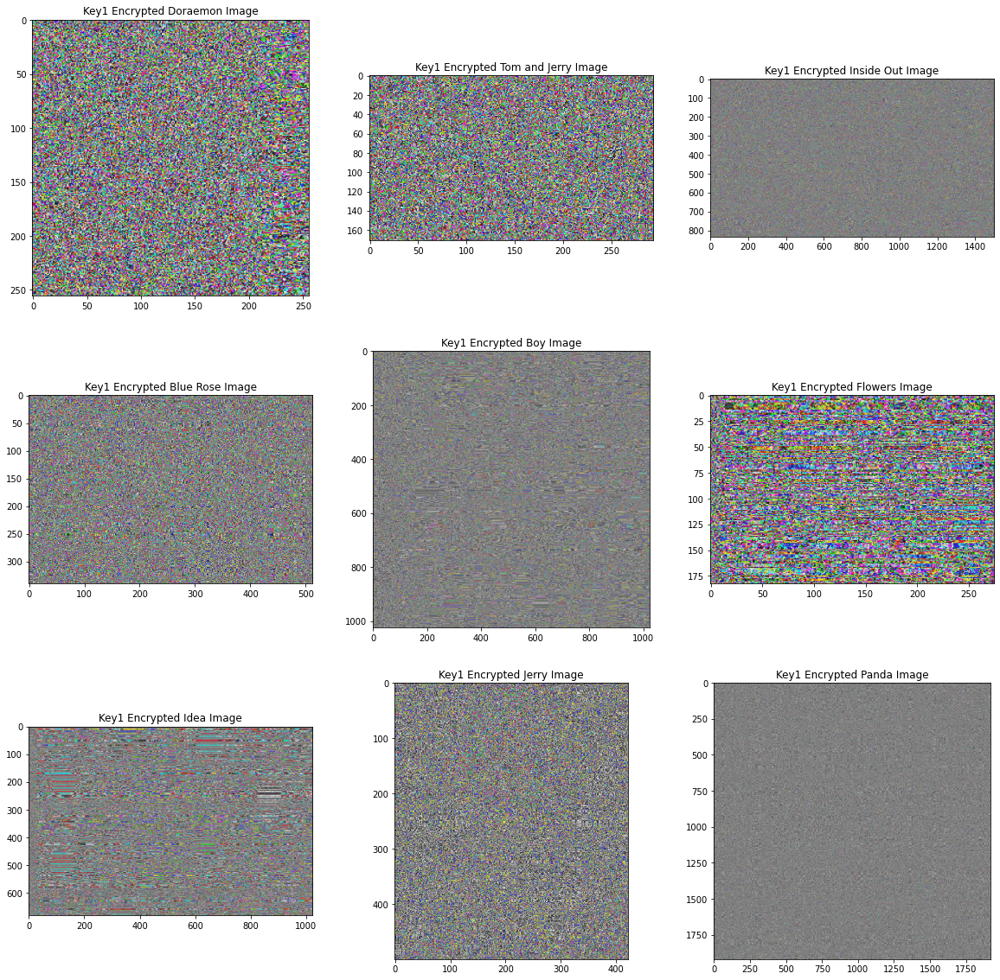

In [39]:
display_images_horizontaly(20, 20, 3, 3, key1_encrypted_images_list, key1_encrypted_images_titles_list)

In [40]:
# Tent Map Sequence Constants
X_TENT_MAP = 0.5
C_TENT_MAP = 1.5

In [41]:
# Function to get Tent Map sequence for generation of second key
# x     - The begining of tent map sequence
# c     - The control parameter
# limit - The number of elements required in the sequence
def get_tent_map(x, c, limit):
    def get_next_element(x, c):
        if 0 <= x <= 0.5:
            return c * x
        if 0.5 <= x <= 1:
            return c * (1 - x)
        return x
    result = []
    for i in range(limit):
        result.append(x)
        x = get_next_element(x, c)
    return result

In [42]:
# Function to get Tent Map Sequence for a given Image
def get_tent_map_sequence_for_an_image(image, x, c):
    limit_x, limit_y, z = np.shape(image)
    return get_tent_map(x, c, limit_x)

In [43]:
# Tent map sequences for the different images
tent_map_result_doraemon_image      = get_tent_map_sequence_for_an_image(rgb_doraemon_image, X_TENT_MAP, C_TENT_MAP)
tent_map_result_tom_and_jerry_image = get_tent_map_sequence_for_an_image(rgb_tom_and_jerry_image, X_TENT_MAP, C_TENT_MAP)
tent_map_result_inside_out_image    = get_tent_map_sequence_for_an_image(rgb_inside_out_image, X_TENT_MAP, C_TENT_MAP)
tent_map_result_blue_rose_image     = get_tent_map_sequence_for_an_image(rgb_blue_rose_image, X_TENT_MAP, C_TENT_MAP)
tent_map_result_boy_image           = get_tent_map_sequence_for_an_image(rgb_boy_image, X_TENT_MAP, C_TENT_MAP)
tent_map_result_flowers_image       = get_tent_map_sequence_for_an_image(rgb_flowers_image, X_TENT_MAP, C_TENT_MAP)
tent_map_result_idea_image          = get_tent_map_sequence_for_an_image(rgb_idea_image, X_TENT_MAP, C_TENT_MAP)
tent_map_result_jerry_image         = get_tent_map_sequence_for_an_image(rgb_jerry_image, X_TENT_MAP, C_TENT_MAP)
tent_map_result_panda_image         = get_tent_map_sequence_for_an_image(rgb_panda_image, X_TENT_MAP, C_TENT_MAP)

In [44]:
# IEEE 754 double precision converted tent map sequences for images
converted_tent_map_result_doraemon_image      = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in tent_map_result_doraemon_image]
converted_tent_map_result_tom_and_jerry_image = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in tent_map_result_tom_and_jerry_image]
converted_tent_map_result_inside_out_image    = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in tent_map_result_inside_out_image]
converted_tent_map_result_blue_rose_image     = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in tent_map_result_blue_rose_image ]
converted_tent_map_result_boy_image           = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in tent_map_result_boy_image]
converted_tent_map_result_flowers_image       = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in tent_map_result_flowers_image]
converted_tent_map_result_idea_image          = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in tent_map_result_idea_image]
converted_tent_map_result_jerry_image         = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in tent_map_result_jerry_image]
converted_tent_map_result_panda_image         = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in tent_map_result_panda_image]

In [45]:
# Bernouilli Map Constants
X_BERNOULLI_MAP = (0.25 * 1.75) - 0.5
A_BERNOULLI_MAP = 0.5
B_BERNOULLI_MAP = 1.75

In [46]:
# Function to get the bernoulli map sequence for the given image
# x     - The begining of the sequence for the bernoulli map
# a     - The control parameter for the sequence
# b     - The constant parameter for the sequence
# limit - The number of elements to be generated for the sequence
def get_bernoulli_map(x, a, b, limit):
    def get_next_element(x, a, b):
        if -a <= x <= 0:
            return (b * x) - a
        elif 0 <= x <= a:
            return (b * x) + a
        return 0
    result = []
    for i in range(limit):
        result.append(x)
        x = get_next_element(x, a, b)
    return result

In [47]:
def get_bernoulli_map_sequence_for_an_image(image, x, a, b):
    limit_x, limit_y, z = np.shape(image)
    return get_bernoulli_map(x, a, b, limit_y)

In [48]:
# Bernoulli map sequences for the different images
bernoulli_map_result_doraemon_image      = get_bernoulli_map_sequence_for_an_image(
    rgb_doraemon_image, X_BERNOULLI_MAP, A_BERNOULLI_MAP, B_BERNOULLI_MAP)
bernoulli_map_result_tom_and_jerry_image = get_bernoulli_map_sequence_for_an_image(
    rgb_tom_and_jerry_image, X_BERNOULLI_MAP, A_BERNOULLI_MAP, B_BERNOULLI_MAP)
bernoulli_map_result_inside_out_image    = get_bernoulli_map_sequence_for_an_image(
    rgb_inside_out_image, X_BERNOULLI_MAP, A_BERNOULLI_MAP, B_BERNOULLI_MAP)
bernoulli_map_result_blue_rose_image     = get_bernoulli_map_sequence_for_an_image(
    rgb_blue_rose_image, X_BERNOULLI_MAP, A_BERNOULLI_MAP, B_BERNOULLI_MAP)
bernoulli_map_result_boy_image           = get_bernoulli_map_sequence_for_an_image(
    rgb_boy_image, X_BERNOULLI_MAP, A_BERNOULLI_MAP, B_BERNOULLI_MAP)
bernoulli_map_result_flowers_image       = get_bernoulli_map_sequence_for_an_image(
    rgb_flowers_image, X_BERNOULLI_MAP, A_BERNOULLI_MAP, B_BERNOULLI_MAP)
bernoulli_map_result_idea_image          = get_bernoulli_map_sequence_for_an_image(
    rgb_idea_image, X_BERNOULLI_MAP, A_BERNOULLI_MAP, B_BERNOULLI_MAP)
bernoulli_map_result_jerry_image         = get_bernoulli_map_sequence_for_an_image(
    rgb_jerry_image, X_BERNOULLI_MAP, A_BERNOULLI_MAP, B_BERNOULLI_MAP)
bernoulli_map_result_panda_image         = get_bernoulli_map_sequence_for_an_image(
    rgb_panda_image, X_BERNOULLI_MAP, A_BERNOULLI_MAP, B_BERNOULLI_MAP)

In [49]:
# IEEE 754 double precision converted tent map sequences for images
converted_bernoulli_map_result_doraemon_image      = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in bernoulli_map_result_doraemon_image]
converted_bernoulli_map_result_tom_and_jerry_image = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in bernoulli_map_result_tom_and_jerry_image]
converted_bernoulli_map_result_inside_out_image    = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in bernoulli_map_result_inside_out_image]
converted_bernoulli_map_result_blue_rose_image     = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in bernoulli_map_result_blue_rose_image ]
converted_bernoulli_map_result_boy_image           = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in bernoulli_map_result_boy_image]
converted_bernoulli_map_result_flowers_image       = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in bernoulli_map_result_flowers_image]
converted_bernoulli_map_result_idea_image          = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in bernoulli_map_result_idea_image]
converted_bernoulli_map_result_jerry_image         = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in bernoulli_map_result_jerry_image]
converted_bernoulli_map_result_panda_image         = [int(convert_binary_number_to_required_bits(
    IEEE_754_double_precision_convertor(each), 327), 2) for each in bernoulli_map_result_panda_image]

In [50]:
# Function to generate second encryption key from tent map and bernoulli map sequences
# tent_map_result      - Sequence generated using the tent map equation
# bernoulli_map_result - Sequence generated using the bernoulli map equation
# image                - The image for which the key is required
def generate_key2_for_an_image(tent_map_result, bernoulli_map_result, image):
    limit_x, limit_y, x = np.shape(image)
    return [[int(tent_map_result[i] + bernoulli_map_result[j]) % 256 for j in range(limit_y)] for i in range(limit_x)]

In [51]:
# Second keys for creating another level of confusion in the images
key2_doraemon_image      = generate_key2_for_an_image(converted_tent_map_result_doraemon_image, 
                                                  converted_bernoulli_map_result_doraemon_image, 
                                                  rgb_doraemon_image)
key2_tom_and_jerry_image = generate_key2_for_an_image(converted_tent_map_result_tom_and_jerry_image, 
                                                  converted_bernoulli_map_result_tom_and_jerry_image, 
                                                  rgb_tom_and_jerry_image)
key2_inside_out_image    = generate_key2_for_an_image(converted_tent_map_result_inside_out_image, 
                                                  converted_bernoulli_map_result_inside_out_image, 
                                                  rgb_inside_out_image)
key2_blue_rose_image     = generate_key2_for_an_image(converted_tent_map_result_blue_rose_image, 
                                                  converted_bernoulli_map_result_blue_rose_image, 
                                                  rgb_blue_rose_image)
key2_boy_image           = generate_key2_for_an_image(converted_tent_map_result_boy_image, 
                                                  converted_bernoulli_map_result_boy_image, 
                                                  rgb_boy_image)
key2_flowers_image       = generate_key2_for_an_image(converted_tent_map_result_flowers_image, 
                                                  converted_bernoulli_map_result_flowers_image, 
                                                  rgb_flowers_image)
key2_idea_image          = generate_key2_for_an_image(converted_tent_map_result_idea_image, 
                                                  converted_bernoulli_map_result_idea_image, 
                                                  rgb_idea_image)
key2_jerry_image         = generate_key2_for_an_image(converted_tent_map_result_jerry_image, 
                                                  converted_bernoulli_map_result_jerry_image, 
                                                  rgb_jerry_image)
key2_panda_image         = generate_key2_for_an_image(converted_tent_map_result_panda_image, 
                                                  converted_bernoulli_map_result_panda_image, 
                                                  rgb_panda_image)

In [52]:
# Key 2 Encrypted images
key2_encrypted_doraemon_image      = get_key_encrypted_image(key1_encrypted_doraemon_image, key2_doraemon_image)
key2_encrypted_tom_and_jerry_image = get_key_encrypted_image(key1_encrypted_tom_and_jerry_image, key2_tom_and_jerry_image)
key2_encrypted_inside_out_image    = get_key_encrypted_image(key1_encrypted_inside_out_image, key2_inside_out_image)
key2_encrypted_blue_rose_image     = get_key_encrypted_image(key1_encrypted_blue_rose_image, key2_blue_rose_image)
key2_encrypted_boy_image           = get_key_encrypted_image(key1_encrypted_boy_image, key2_boy_image)
key2_encrypted_flowers_image       = get_key_encrypted_image(key1_encrypted_flowers_image, key2_flowers_image)
key2_encrypted_idea_image          = get_key_encrypted_image(key1_encrypted_idea_image, key2_idea_image)
key2_encrypted_jerry_image         = get_key_encrypted_image(key1_encrypted_jerry_image, key2_jerry_image)
key2_encrypted_panda_image         = get_key_encrypted_image(key1_encrypted_panda_image, key2_panda_image)

In [53]:
key2_encrypted_images_list        = [key2_encrypted_doraemon_image, key2_encrypted_tom_and_jerry_image, 
                                     key2_encrypted_inside_out_image, key2_encrypted_blue_rose_image, 
                                     key2_encrypted_boy_image, key2_encrypted_flowers_image,
                                     key2_encrypted_idea_image, key2_encrypted_jerry_image, key2_encrypted_panda_image]
key2_encrypted_images_titles_list = ["Key2 Encrypted Doraemon Image", "Key2 Encrypted Tom and Jerry Image", 
                                     "Key2 Encrypted Inside Out Image", "Key2 Encrypted Blue Rose Image", 
                                     "Key2 Encrypted Boy Image", "Key2 Encrypted Flowers Image",
                                     "Key2 Encrypted Idea Image", "Key2 Encrypted Jerry Image", "Key2 Encrypted Panda Image"]

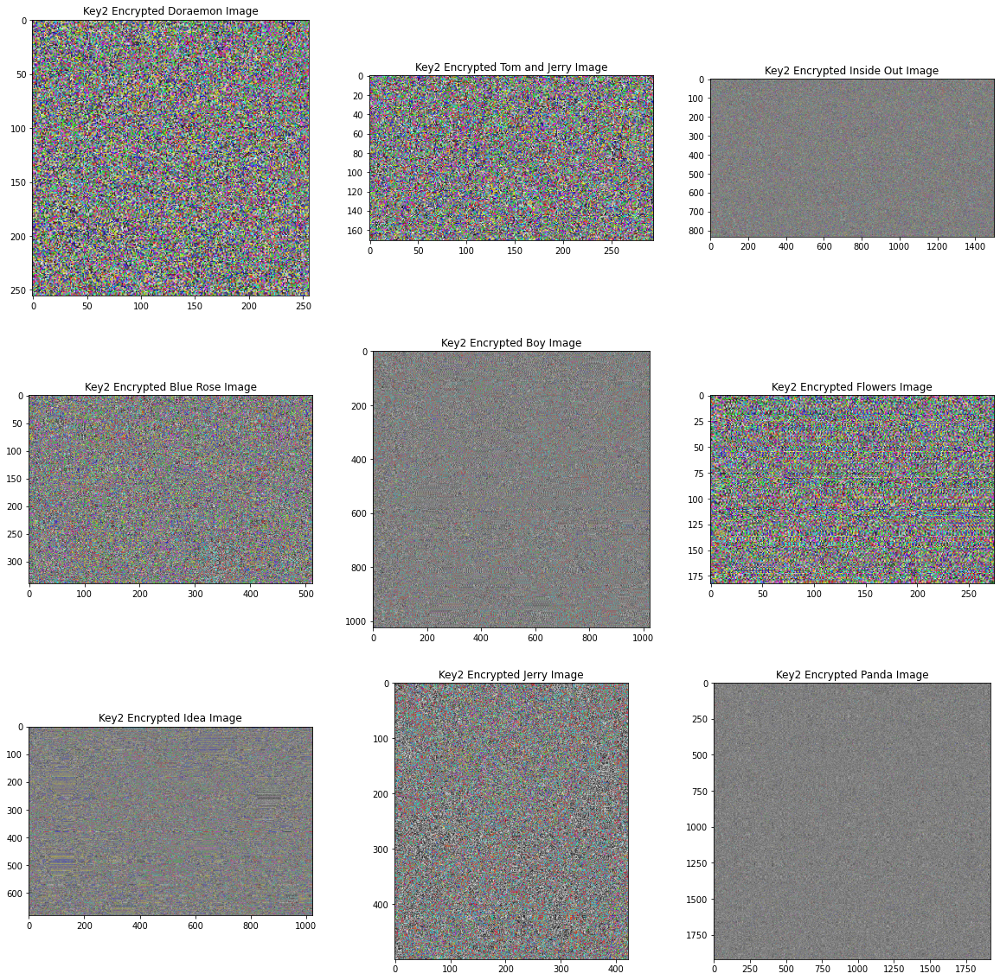

In [54]:
display_images_horizontaly(20, 20, 3, 3, key2_encrypted_images_list, key2_encrypted_images_titles_list)

In [55]:
# Splitting the different ecncrypted images into red, blue and green images
blue_encrypted_doraemon_image,      green_encrypted_doraemon_image,      red_encrypted_doraemon_image      = \
cv2.split(np.array(key2_encrypted_doraemon_image))
blue_encrypted_tom_and_jerry_image, green_encrypted_tom_and_jerry_image, red_encrypted_tom_and_jerry_image = \
cv2.split(np.array(key2_encrypted_tom_and_jerry_image))
blue_encrypted_inside_out_image,    green_encrypted_inside_out_image,    red_encrypted_inside_out_image    = \
cv2.split(np.array(key2_encrypted_inside_out_image))
blue_encrypted_blue_rose_image,     green_encrypted_blue_rose_image,     red_encrypted_blue_rose_image     = \
cv2.split(np.array(key2_encrypted_blue_rose_image))
blue_encrypted_boy_image,           green_encrypted_boy_image,           red_encrypted_boy_image           = \
cv2.split(np.array(key2_encrypted_boy_image))
blue_encrypted_flowers_image,       green_encrypted_flowers_image,       red_encrypted_flowers_image       = \
cv2.split(np.array(key2_encrypted_flowers_image))
blue_encrypted_idea_image,          green_encrypted_idea_image,          red_encrypted_idea_image          = \
cv2.split(np.array(key2_encrypted_idea_image))
blue_encrypted_jerry_image,         green_encrypted_jerry_image,         red_encrypted_jerry_image         = \
cv2.split(np.array(key2_encrypted_jerry_image))
blue_encrypted_panda_image,         green_encrypted_panda_image,         red_encrypted_panda_image         = \
cv2.split(np.array(key2_encrypted_panda_image))

In [56]:
# Function to decrypt image encrypted using two keys, key1 and key2
# key1  - First key used for image encryption
# key2  - Second key used for image encryption
# image - The Image to decrypt
def decrypt_two_keys_encrypted_image(key1, key2, image):
    limit_x, limit_y, z = np.shape(image)
    blue, green, red = cv2.split(np.array(image))
    for i in range(limit_x):
        for j in range(limit_y):
            red[i][j]   ^= (key1[i][j] ^ key2[i][j])
            blue[i][j]  ^= (key1[i][j] ^ key2[i][j])
            green[i][j] ^= (key1[i][j] ^ key2[i][j])
    return cv2.merge([red, green, blue])

In [57]:
two_keys_decrypted_doraemon_image      = decrypt_two_keys_encrypted_image(
    key1_doraemon_image, key2_doraemon_image, key2_encrypted_doraemon_image)
two_keys_decrypted_tom_and_jerry_image = decrypt_two_keys_encrypted_image(
    key1_tom_and_jerry_image, key2_tom_and_jerry_image, key2_encrypted_tom_and_jerry_image)
two_keys_decrypted_inside_out_image   = decrypt_two_keys_encrypted_image(
    key1_inside_out_image, key2_inside_out_image, key2_encrypted_inside_out_image)
two_keys_decrypted_blue_rose_image     = decrypt_two_keys_encrypted_image(
    key1_blue_rose_image, key2_blue_rose_image, key2_encrypted_blue_rose_image)
two_keys_decrypted_boy_image           = decrypt_two_keys_encrypted_image(
    key1_boy_image, key2_boy_image, key2_encrypted_boy_image)
two_keys_decrypted_flowers_image       = decrypt_two_keys_encrypted_image(
    key1_flowers_image, key2_flowers_image, key2_encrypted_flowers_image)
two_keys_decrypted_idea_image          = decrypt_two_keys_encrypted_image(
    key1_idea_image, key2_idea_image, key2_encrypted_idea_image)
two_keys_decrypted_jerry_image         = decrypt_two_keys_encrypted_image(
    key1_jerry_image, key2_jerry_image, key2_encrypted_jerry_image)
two_keys_decrypted_panda_image         = decrypt_two_keys_encrypted_image(
    key1_panda_image, key2_panda_image, key2_encrypted_panda_image)

In [58]:
two_key_decrypted_images_list        = [two_keys_decrypted_doraemon_image, two_keys_decrypted_tom_and_jerry_image, 
                                        two_keys_decrypted_inside_out_image, two_keys_decrypted_blue_rose_image, 
                                        two_keys_decrypted_boy_image, two_keys_decrypted_flowers_image,
                                        two_keys_decrypted_idea_image, two_keys_decrypted_jerry_image, 
                                        two_keys_decrypted_panda_image]
two_key_decrypted_images_titles_list = ["Two Keys Decrypted Doraemon Image", "Two Keys Decrypted Tom and Jerry Image", 
                                        "Two Keys Decrypted Inside Out Image", "Two Keys Decrypted Blue Rose Image", 
                                        "Two Keys Decrypted Boy Image", "Two Keys Decrypted Flowers Image",
                                        "Two Keys Decrypted Idea Image", "Two Keys Decrypted Jerry Image", 
                                        "Two Keys Decrypted Panda Image"]

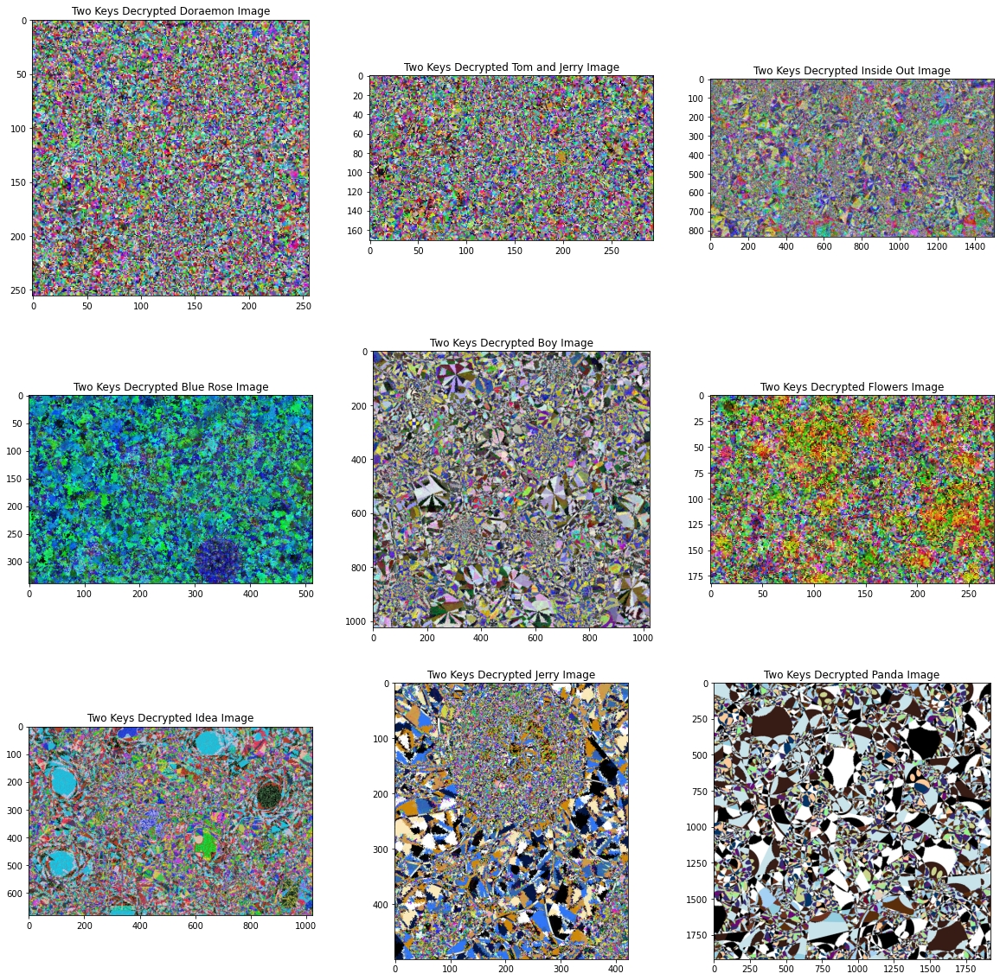

In [59]:
display_images_horizontaly(20, 20, 3, 3, two_key_decrypted_images_list, two_key_decrypted_images_titles_list)

In [60]:
# Kaa Un-Mapping of images for getting back original pixels
kaa_unmapped_doraemon_image      = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          two_keys_decrypted_doraemon_image, True)
kaa_unmapped_tom_and_jerry_image = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          two_keys_decrypted_tom_and_jerry_image, True)
kaa_unmapped_inside_out_image    = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          two_keys_decrypted_inside_out_image, True)
kaa_unmapped_blue_rose_image     = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          two_keys_decrypted_blue_rose_image, True)
kaa_unmapped_boy_image           = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          two_keys_decrypted_boy_image, True)
kaa_unmapped_flowers_image       = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          two_keys_decrypted_flowers_image, True)
kaa_unmapped_idea_image          = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          two_keys_decrypted_idea_image, True)
kaa_unmapped_jerry_image         = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          two_keys_decrypted_jerry_image, True)
kaa_unmapped_panda_image         = perform_combined_transformation_in_image(THETA, VELOCITY1, VELOCITY2, TIME, FREQUENCY, 
                                                                          two_keys_decrypted_panda_image, True)

In [61]:
kaa_unmapped_images_list        = [kaa_unmapped_doraemon_image, kaa_unmapped_tom_and_jerry_image, 
                                   kaa_unmapped_inside_out_image, kaa_unmapped_blue_rose_image, kaa_unmapped_boy_image, 
                                   kaa_unmapped_flowers_image, kaa_unmapped_idea_image, kaa_unmapped_jerry_image, 
                                   kaa_unmapped_panda_image]
kaa_unmapped_images_titles_list = ["KAA Un-Mapped Doraemon Image", "KAA Un-Mapped Tom and Jerry Image", 
                                   "KAA Un-Mapped Inside Out Image","KAA Un-Mapped Blue Rose Image", 
                                   "KAA Un-Mapped Boy Image", "KAA Un-Mapped Flowers Image","KAA Un-Mapped Idea Image", 
                                   "KAA Un-Mapped Jerry Image", "KAA Un-Mapped Panda Image"]

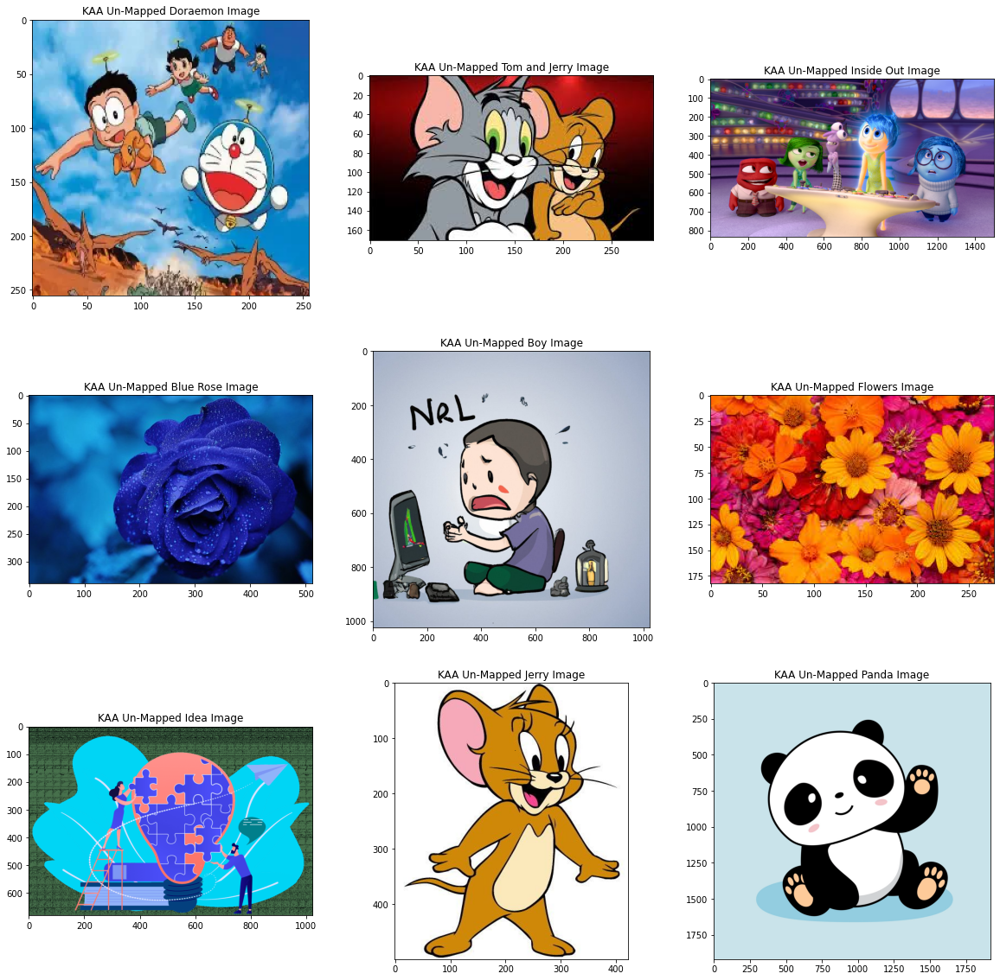

In [62]:
display_images_horizontaly(20, 20, 3, 3, kaa_unmapped_images_list, kaa_unmapped_images_titles_list)

In [63]:
### VISUAL AND HISTOGRAM ANALYSES 

In [64]:
# Function to convert a 2D array to 1D array for the purpose of vieweing a histogram
# two_dimensional_array - The 2D array the needs to be converted into a 1D array
def convert_2D_array_to_1D_array(two_dimensional_array):
    x, y = len(two_dimensional_array), len(two_dimensional_array[0])
    return [two_dimensional_array[i][j] for i in range(x) for j in range(y)]

In [65]:
# Function to get frequency of different pixels in an array
# one_dimensional_array - 1D array containing all the pixels of a particular channel in the range of [0,255]
def get_frequency_of_pixels(one_dimensional_array):
    pixels = [0 for each in range(256)]
    for each in one_dimensional_array:
        pixels[each] += 1
    return pixels

In [66]:
# Function to display histograms of tuples containing red, blue and green channels of an image
# This function helps in comparing between vieweing the color distribution of original and encrypted image
# length                 - Length of the 2D histogram to be displayed
# breadth                - Breadth of the 2D histogram to be displayed
# channles_original      - Contains list of tuples of the three RGB channles of the original image
# in the order of red, blue and green
# channels_encrypted     - Contains list of tuples of the three RGB channels of the encrypted image 
# in the order of red, blue and green
# image_titles           - Contains the list of titles of image for which the histogram is being displayed
def display_histograms_of_three_channels(length, breadth, channels_original, channels_encrypted, image_titles):
    limit = len(image_titles)
    rcParams['figure.figsize'] = length, breadth
    total_pixels = [each for each in range(256)]
    figure, axis = plt.subplots(limit, 6)
    for x in range(limit):
        axis[x][0].bar(total_pixels, get_frequency_of_pixels(convert_2D_array_to_1D_array(channels_original[x][0])), 
                       color='red', linewidth=0.1)
        axis[x][0].set_title("Red Channel for Original {}".format(image_titles[x]))
        axis[x][1].bar(total_pixels, get_frequency_of_pixels(convert_2D_array_to_1D_array(channels_original[x][1])), 
                       color='blue', linewidth=0.1)
        axis[x][1].set_title("Blue Channel for Original {}".format(image_titles[x]))
        axis[x][2].bar(total_pixels, get_frequency_of_pixels(convert_2D_array_to_1D_array(channels_original[x][2])), 
                       color='green', linewidth=0.1)
        axis[x][2].set_title("Green Channel for Original {}".format(image_titles[x]))
        axis[x][3].bar(total_pixels, get_frequency_of_pixels(convert_2D_array_to_1D_array(channels_encrypted[x][0])), 
                           color='red', linewidth=0.1)
        axis[x][3].set_title("Red Channel for Encrypted {}".format(image_titles[x]))
        axis[x][4].bar(total_pixels, get_frequency_of_pixels(convert_2D_array_to_1D_array(channels_encrypted[x][1])), 
                           color='blue', linewidth=0.1)
        axis[x][4].set_title("Blue Channel for Encrypted {}".format(image_titles[x]))
        axis[x][5].bar(total_pixels, get_frequency_of_pixels(convert_2D_array_to_1D_array(channels_encrypted[x][2])), 
                           color='green', linewidth=0.1)
        axis[x][5].set_title("Green Channel for Encrypted {}".format(image_titles[x]))
    return None

In [67]:
# Original and Encrypted Channels for different Images
channels_encrypted_doraemon_image, channels_original_doraemon_image           = \
(red_encrypted_doraemon_image, blue_encrypted_doraemon_image, green_encrypted_doraemon_image), \
(red_doraemon_image, blue_doraemon_image, green_doraemon_image)
channels_encrypted_tom_and_jerry_image, channels_original_tom_and_jerry_image = \
(red_encrypted_tom_and_jerry_image, blue_encrypted_tom_and_jerry_image, green_encrypted_tom_and_jerry_image), \
(red_tom_and_jerry_image, blue_tom_and_jerry_image, green_tom_and_jerry_image)
channels_encrypted_inside_out_image, channels_original_inside_out_image       = \
(red_encrypted_inside_out_image, blue_encrypted_inside_out_image, green_encrypted_inside_out_image), \
(red_inside_out_image, blue_inside_out_image, green_inside_out_image)
channels_encrypted_blue_rose_image, channels_original_blue_rose_image         = \
(red_encrypted_blue_rose_image, blue_encrypted_blue_rose_image, green_encrypted_blue_rose_image), \
(red_blue_rose_image, blue_blue_rose_image, green_blue_rose_image)
channels_encrypted_boy_image, channels_original_boy_image                     = \
(red_encrypted_boy_image, blue_encrypted_boy_image, green_encrypted_boy_image), \
(red_boy_image, blue_boy_image, green_boy_image)
channels_encrypted_flowers_image, channels_original_flowers_image             = \
(red_encrypted_flowers_image, blue_encrypted_flowers_image, green_encrypted_flowers_image), \
(red_flowers_image, blue_flowers_image, green_flowers_image)
channels_encrypted_idea_image, channels_original_idea_image                   = \
(red_encrypted_idea_image, blue_encrypted_idea_image, green_encrypted_idea_image), \
(red_idea_image, blue_idea_image, green_idea_image)
channels_encrypted_jerry_image, channels_original_jerry_image                 = \
(red_encrypted_jerry_image, blue_encrypted_jerry_image, green_encrypted_jerry_image), \
(red_jerry_image, blue_jerry_image, green_jerry_image)
channels_encrypted_panda_image, channels_original_panda_image                 = \
(red_encrypted_panda_image, blue_encrypted_panda_image, green_encrypted_panda_image), \
(red_panda_image, blue_panda_image, green_panda_image)

In [68]:
channels_encrypted = [channels_encrypted_doraemon_image, channels_encrypted_tom_and_jerry_image, 
                      channels_encrypted_inside_out_image, channels_encrypted_blue_rose_image, channels_encrypted_boy_image, 
                      channels_encrypted_flowers_image, channels_encrypted_idea_image, channels_encrypted_jerry_image, 
                      channels_encrypted_panda_image]
channels_original  = [channels_original_doraemon_image, channels_original_tom_and_jerry_image, 
                      channels_original_inside_out_image, channels_original_blue_rose_image, channels_original_boy_image, 
                      channels_original_flowers_image, channels_original_idea_image, channels_original_jerry_image, 
                      channels_original_panda_image]
image_titles       = ["Doraemon Image", "Tom and Jerry Image", "Inside Out Image", "Blue Rose Image", "Boy Image", 
                      "Flowers Image", "Idea Image", "Jerry Image", "Panda Image"]

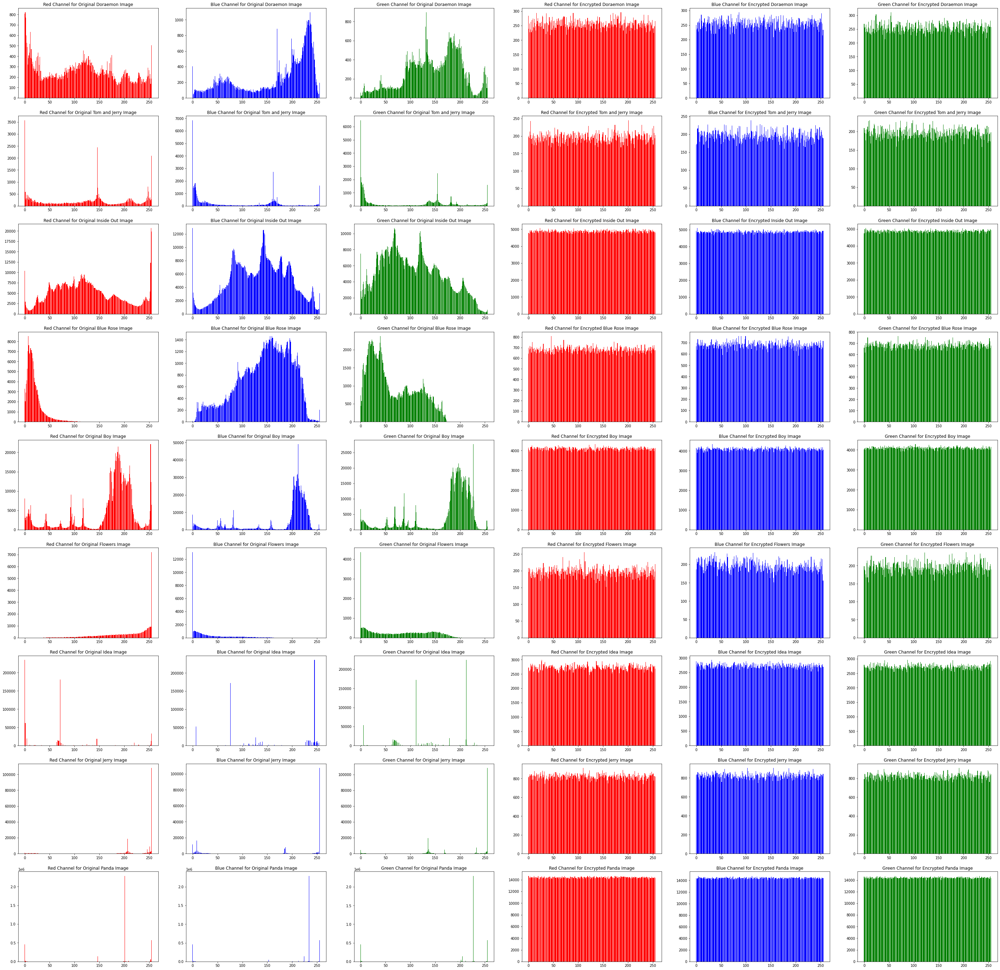

In [69]:
display_histograms_of_three_channels(50, 50, channels_original, channels_encrypted, image_titles)

In [70]:
### INFORMATION ENTROPY

In [71]:
# Function to get information entropy of encrypted channels
# channels_encrypted - List of tuples of rgb channels of encrypted images
# image_titles       - List of titles for the images
def get_information_entropy(channels_encrypted, image_titles):
    def get_entropy(channel):
        _bins = 256
        hist, _ = np.histogram(channel.ravel(), bins=_bins, range=(0, _bins))
        prob_dist = hist / hist.sum()
        return entropy(prob_dist, base=2)
    x = len(image_titles)
    e = {"Red Channel": [], "Blue Channel": [], "Green Channel": [], "Image": []}
    for i in range(x):
        e["Red Channel"].append(get_entropy(channels_encrypted[i][0]))
        e["Blue Channel"].append(get_entropy(channels_encrypted[i][1]))
        e["Green Channel"].append(get_entropy(channels_encrypted[i][2]))
        e["Image"].append(get_entropy(cv2.merge(
            [channels_encrypted[i][0], channels_encrypted[i][2], channels_encrypted[i][1]])))
    df = pd.DataFrame(e)
    df.index = image_titles
    return df

In [72]:
information_entropy_df_of_encrypted_image = get_information_entropy(channels_encrypted, image_titles)
information_entropy_df_of_original_image  = get_information_entropy(channels_original,  image_titles)
print("###############################################################################")
print("Encrypted Image")
print("###############################################################################")
print(information_entropy_df_of_encrypted_image)
print("###############################################################################")
print("Original Image")
print("###############################################################################")
print(information_entropy_df_of_original_image)
print("###############################################################################")

###############################################################################
Encrypted Image
###############################################################################
                     Red Channel  Blue Channel  Green Channel     Image
Doraemon Image          7.997365      7.997156       7.996973  7.999091
Tom and Jerry Image     7.996433      7.996289       7.996704  7.998772
Inside Out Image        7.999843      7.999864       7.999865  7.999951
Blue Rose Image         7.998881      7.998763       7.998973  7.999574
Boy Image               7.999782      7.999794       7.999843  7.999937
Flowers Image           7.996473      7.996012       7.995753  7.998907
Idea Image              7.999156      7.999476       7.999436  7.999753
Jerry Image             7.999165      7.999153       7.999032  7.999686
Panda Image             7.999950      7.999950       7.999948  7.999976
###############################################################################
Original Image
#########

In [73]:
original_images  = [rgb_doraemon_image, rgb_tom_and_jerry_image, rgb_inside_out_image, rgb_blue_rose_image, rgb_boy_image,
                    rgb_flowers_image, rgb_idea_image, rgb_jerry_image, rgb_panda_image]
encrypted_images = [key2_encrypted_doraemon_image, key2_encrypted_tom_and_jerry_image, key2_encrypted_inside_out_image, 
                    key2_encrypted_blue_rose_image, key2_encrypted_boy_image, key2_encrypted_flowers_image, 
                    key2_encrypted_idea_image, key2_encrypted_jerry_image, key2_encrypted_panda_image]
image_titles       = ["Doraemon Image", "Tom and Jerry Image", "Inside Out Image", "Blue Rose Image", "Boy Image", 
                      "Flowers Image", "Idea Image", "Jerry Image", "Panda Image"]

In [74]:
### MEAN SQUARED ERROR

In [75]:
# Function to calculate mean squared error between original and encrypted images
# original_images  - List of orignal images
# encrypted_images - List of encrypted images
# image_titles     - List of titles for the images
def get_mean_sqaured_error(original_images, encrypted_images, image_titles):
    def error(original_image, encrypted_image):
        error = np.sum((original_image.astype("float") - encrypted_image.astype("float")) ** 2)
        error /= float(original_image.shape[0] * encrypted_image.shape[1])
        return error
    df = pd.DataFrame()
    df['MSE'] = [error(original_images[i], encrypted_images[i]) for i in range(len(image_titles))]
    df.index = image_titles
    return df

In [76]:
mean_squared_error_df = get_mean_sqaured_error(original_images, encrypted_images, image_titles)
print("###############################################################################")
print("Mean Squared Error")
print("###############################################################################")
print(mean_squared_error_df)
print("###############################################################################")

###############################################################################
Mean Squared Error
###############################################################################
                              MSE
Doraemon Image       32294.451660
Tom and Jerry Image  42382.251542
Inside Out Image     27786.351954
Blue Rose Image      37549.497007
Boy Image            34731.964033
Flowers Image        42296.647968
Idea Image           40522.690314
Jerry Image          54125.648346
Panda Image          48954.977058
###############################################################################


In [77]:
### PEAK SIGNAL TO NOISE RATIO

In [78]:
# Function to calculate peak signal to noise ratio
# original_images  - List of orignal images
# encrypted_images - List of encrypted images
# image_titles     - List of titles for the images
def get_peak_signal_to_noise_ratio(original_images, encrypted_images, image_titles):
    df = pd.DataFrame()
    df['PSNR'] = [cv2.PSNR(original_images[i], encrypted_images[i]) for i in range(len(image_titles))]
    df.index = image_titles
    return df

In [79]:
peak_signal_to_noise_ratio_df = get_peak_signal_to_noise_ratio(original_images, encrypted_images, image_titles)
print("###############################################################################")
print("Peak Signal To Noise Ratio")
print("###############################################################################")
print(peak_signal_to_noise_ratio_df)
print("###############################################################################")

###############################################################################
Peak Signal To Noise Ratio
###############################################################################
                         PSNR
Doraemon Image       7.810737
Tom and Jerry Image  6.630176
Inside Out Image     8.463701
Blue Rose Image      7.155975
Boy Image            7.494723
Flowers Image        6.638957
Idea Image           6.825033
Jerry Image          5.567985
Panda Image          6.004048
###############################################################################


In [80]:
### CORRELATION COEFFICIENT ANALYSIS

In [81]:
# Function to get correlation coefficient between original images and encrypted images
# original_images  - List of original images
# encrypted_images - List of encrypted images
# image_titles     - List of titles for the images
def get_correlation_coefficient_analysis(original_images, enrypted_images, image_titles):
    x = len(image_titles)
    df = pd.DataFrame()
    df['correlation coefficient'] = [np.corrcoef(original_images[i].flat, encrypted_images[i].flat)[1][0] for i in range(x)]
    df.index = image_titles
    return df

In [82]:
correlation_coefficient_analysis_df = get_correlation_coefficient_analysis(original_images, encrypted_images, image_titles)
print("###############################################################################")
print("Correlation Coefficient Analysis")
print("###############################################################################")
print(correlation_coefficient_analysis_df)
print("###############################################################################")

###############################################################################
Correlation Coefficient Analysis
###############################################################################
                     correlation coefficient
Doraemon Image                      0.001120
Tom and Jerry Image                -0.006055
Inside Out Image                    0.000047
Blue Rose Image                    -0.002505
Boy Image                          -0.001050
Flowers Image                      -0.009307
Idea Image                         -0.000402
Jerry Image                        -0.002517
Panda Image                        -0.000469
###############################################################################


In [83]:
key2_encrypted_images_list        = [key2_encrypted_doraemon_image, key2_encrypted_tom_and_jerry_image, 
                                     key2_encrypted_inside_out_image, key2_encrypted_blue_rose_image, 
                                     key2_encrypted_boy_image, key2_encrypted_flowers_image,
                                     key2_encrypted_idea_image, key2_encrypted_jerry_image, key2_encrypted_panda_image]

In [86]:
path = "../Pictures"
for index, each in enumerate(key2_encrypted_images_list):
    filename = "img_{}.jpg".format(index)
    cv2.imwrite(path + "/{}".format(filename), each)